# Style Transfer with Deep Neural Networks

### Imports

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

from pathlib import Path
from scipy import ndimage
from fastai.conv_learner import *
torch.cuda.set_device(0)

torch.backends.cudnn.benchmark=True

PATH = Path(r'C:\Users\Francesco\Notebooks\personal\data')

inames = ['Monet.jpg', 'Picasso.png', 'Dali.png', 'VanGogh.png', 'Kandinsky.png']
nets = [(vgg16, 'Vgg-16 with batch norm added'), 
        (dn121, 'Densenet-121')]
    
max_iter = 1000
show_iter = 200

### Functions

In [44]:
def scale_match(src, targ):
    h,w,_ = src.shape
    sh,sw,_ = targ.shape
    rat = max(h/sh,w/sw); rat
    res = cv2.resize(targ, (int(sw*rat), int(sh*rat)))
    return res[:h,:w]

def plot_reconstruct(rec, titles, what, title):
    rec = rec[:6]
    fig, ax = plt.subplots(2, 3, figsize=(15, 12))
    fig.suptitle(title, fontsize=16)
    
    k=0
    for i in range(2):
        for j in range(3):
            ax[i, j].imshow(rec[k])
            ax[i, j].axis('off')
            l = titles[k] if titles[k] is not None else 'All'
            ax[i, j].set_title(f'{what}: {l}')
            k+=1
            
    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    plt.show()

def load_images(inames):
    ori_name = 'Original.jpg'
    original = open_image(PATH/ori_name)
    styles = [scale_match(original, open_image(PATH/f)) for f in inames]
    names = [ori_name[:-4]] + [i[:-4] for i in inames]
    images = [original] + styles
    
    fig, ax = plt.subplots(2, 3, figsize=(15, 12))
    fig.suptitle("Original Image + (Cropped) Paintings for Style Transfer", fontsize=16)
    
    k=0
    for i in range(2):
        for j in range(3):
            ax[i, j].imshow(images[k])
            ax[i, j].axis('off')
            ax[i, j].set_title(names[k])
            k+=1
            
    fig.tight_layout()
    fig.subplots_adjust(top=0.9)
    plt.show()
    
    return images, names[1:]
    
def load_models_and_transf(nets, sz=240):
    result = []
    for n in nets: 
        net = to_gpu(n[0](True)).eval()
        set_trainable(net, False)
        _, tmfs = tfms_from_model(net, sz)
        result.append((net, tmfs, n[1]))
        
    return result

def get_opt(img, tmfs):
    opt_img = np.random.uniform(0, 1, size=img.shape).astype(np.float32)
    opt_img = scipy.ndimage.filters.median_filter(opt_img, [8,8,1])
    img_tmfs = tmfs(img)
    coeff = tmfs(opt_img).mean(axis=(1,2))/img_tmfs.mean(axis=(1,2))
    opt_img_v = V(tmfs(opt_img/coeff[None, None])[None], requires_grad=True)
    
    return opt_img_v, optim.LBFGS([opt_img_v]), coeff[None, None]

class SaveFeatures():
    features=None
    
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
    
    def hook_fn(self, module, input, output): 
        self.features = output
    
    def close(self): 
        self.hook.remove()
        
def step(loss_fn, kw=None):
    global n_iter
    global idt
    optimizer.zero_grad()
    loss = loss_fn(opt_t, kw)
    loss.backward()
    n_iter+=1
    if n_iter%show_iter==0: 
        print(f'Iteration: {n_iter}, loss: {loss.data[0]}')
        
    return loss

def content_mse(input, target):
    return F.mse_loss(input, target)*1e3

def content_loss(x, l=None):
    model(x)
    opt_act = [V(o.features.clone()) for o in activations]
    if l is None:
        losses = [content_mse(o, s) for o,s in zip(opt_act, target_act)]
        return sum(losses)
    else:
        return content_mse(opt_act[l], target_act[l])

def gram(input):
    b,c,h,w = input.size()
    x = input.view(b*c, -1)
    return torch.mm(x, x.t())/input.numel()*1e6

def gram_mse_loss(input, target): 
    return F.mse_loss(gram(input), gram(target))

def style_loss(x, l=None):
    model(x)
    opt_act = [V(o.features.clone()) for o in activations]
    if l is None:
        losses = [gram_mse_loss(o, s) for o,s in zip(opt_act, target_act)]
        return sum(losses)
    else:
        return gram_mse_loss(opt_act[l], target_act[l])    
    
def combined_loss(x, lam):
    model(x)
    opt_act = [V(o.features.clone()) for o in activations]
    style_losses = [gram_mse_loss(o, s) for o,s in zip(opt_act, target_style)]
    content_losses = [content_mse(opt_act[2], target_cont[2])/1e3]
    #content_losses = [content_mse(o, s)/1e3 for o,s in zip(opt_act, target_cont)]
    style = sum(style_losses)
    content = sum(content_losses)*1e6
    return (1-lam)*content + lam*style
    
def untrasform(x, tmfs):
    return tmfs.denorm(np.rollaxis(to_np(x.data),1,4))[0]

### Styles

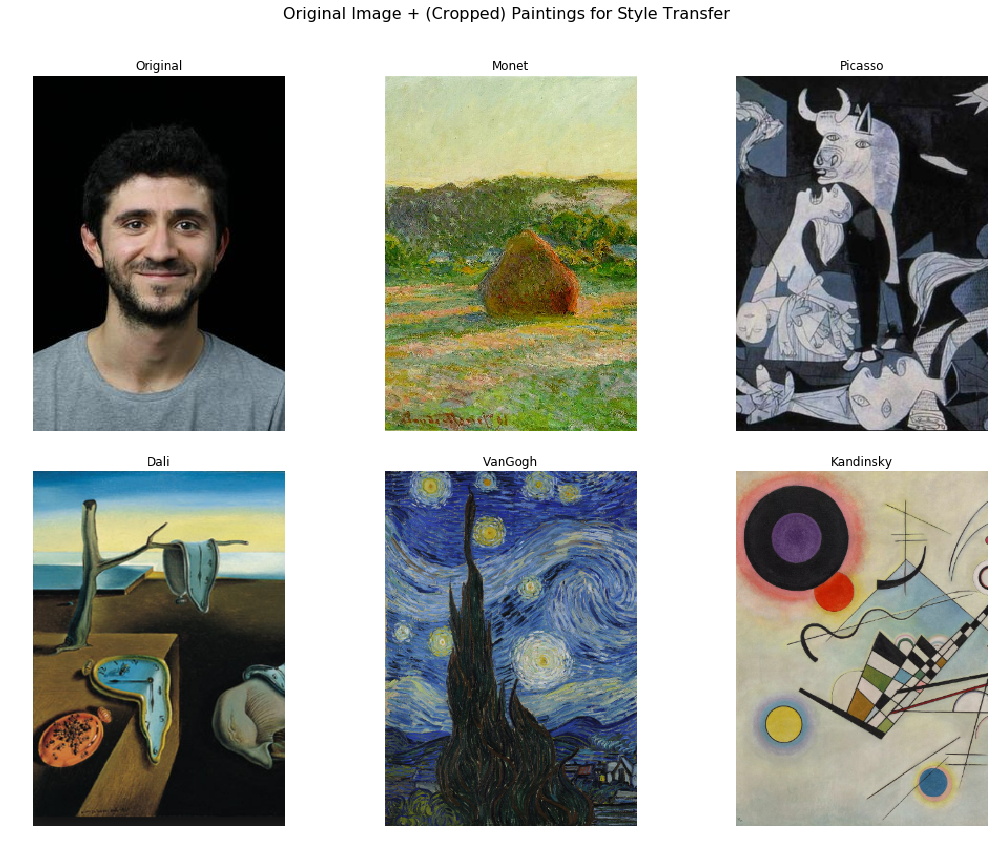

In [3]:
images, names = load_images(inames)
original = images[0]
images = images[1:]

### Content Loss

In [4]:
models = load_models_and_transf(nets)

In [5]:
name = 'Vgg-16 with batch norm added'
#name = 'Densenet-121'

model, transform, name = [model for model in models if model[2] == name][0]

In [6]:
original_t = transform(original)
original_t.shape

(3, 240, 240)

In [7]:
if 'Dense' in name:
    convs = [i for i,o in enumerate(children(model)) if isinstance(o, torchvision.models.densenet._DenseBlock)]
    print(np.array(children(model))[convs][0])
else:
    convs = [i-3 for i,o in enumerate(children(model)) if isinstance(o,nn.MaxPool2d)]
    print(np.array(children(model))[convs])

[Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
 Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
 Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))]


In [8]:
activations = [SaveFeatures(children(model)[idx]) for idx in convs]

In [9]:
model(VV(original_t[None]))
target_act = [V(o.features.clone()) for o in activations]

[o.shape for o in target_act]

[torch.Size([1, 64, 240, 240]),
 torch.Size([1, 128, 120, 120]),
 torch.Size([1, 256, 60, 60]),
 torch.Size([1, 512, 30, 30]),
 torch.Size([1, 512, 15, 15])]

In [10]:
reconstructs = []
layers = convs + [None]

for i, layer in enumerate(layers):
    n_iter=0
    opt_t, optimizer, coeff = get_opt(original, transform)
    if layer is None: 
        i = None
        layer = 'All'
    print(f'Reconstructing Content using Conv Layer :{layer}')

    while n_iter <= max_iter: 
        optimizer.step(partial(step, content_loss, i))
        
    reconstructs.append(untrasform(opt_t, transform))
    print('')

Reconstructing Content using Conv Layer :3
Iteration: 200, loss: 0.014507120475172997
Iteration: 400, loss: 0.00042593645048327744
Iteration: 600, loss: 4.870834163739346e-05
Iteration: 800, loss: 8.26109589979751e-06
Iteration: 1000, loss: 1.8108660242432961e-06

Reconstructing Content using Conv Layer :10
Iteration: 200, loss: 177.21202087402344
Iteration: 400, loss: 134.754150390625
Iteration: 600, loss: 139.78616333007812
Iteration: 800, loss: 142.07235717773438
Iteration: 1000, loss: 147.79100036621094

Reconstructing Content using Conv Layer :20
Iteration: 200, loss: 9.460128784179688
Iteration: 400, loss: 6.626796722412109
Iteration: 600, loss: 5.664234161376953
Iteration: 800, loss: 5.117481231689453
Iteration: 1000, loss: 4.76444149017334

Reconstructing Content using Conv Layer :30
Iteration: 200, loss: 12.424543380737305
Iteration: 400, loss: 5.134835243225098
Iteration: 600, loss: 2.8448777198791504
Iteration: 800, loss: 1.826348066329956
Iteration: 1000, loss: 1.3152878284

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


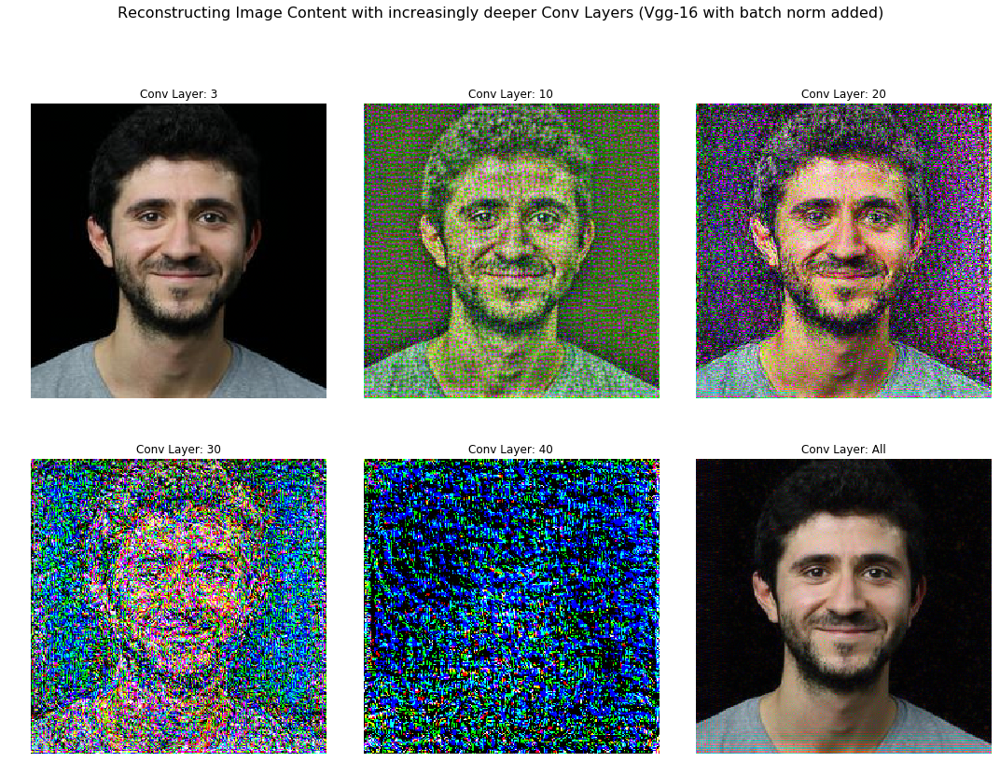

In [11]:
plot_reconstruct(reconstructs, layers, 'Conv Layer', 
                 f"Reconstructing Image Content with increasingly deeper Conv Layers ({name})")

## Van Gogh

### Style Loss

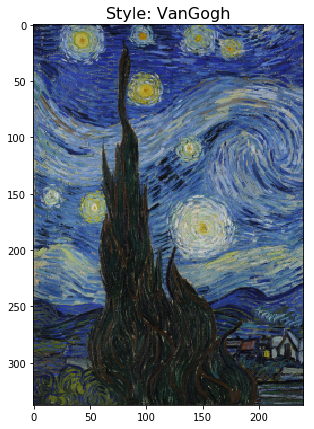

In [40]:
style_name = 'VanGogh'
style_img = images[[i for i,l in enumerate(names) if l == style_name][0]]

plt.figure(figsize=(10,7));
plt.imshow(style_img);
plt.title(f'Style: {style_name}', fontsize=16);

In [41]:
style_t = transform(style_img)
style_t.shape

(3, 240, 240)

In [14]:
model(VV(style_t[None]))
target_act = [V(o.features.clone()) for o in activations]

In [15]:
opt_t, optimizer, coeff = get_opt(style_img, transform)
opt_t.shape

torch.Size([1, 3, 240, 240])

In [16]:
reconstructs = []
layers = convs + [None]

for i, layer in enumerate(layers):
    n_iter=0
    opt_t, optimizer, coeff = get_opt(style_img, transform)
    if layer is None: 
        i = None
        layer = 'All'    
    
    print(f'Reconstructing Content using Conv Layer :{layer}')

    while n_iter <= max_iter: 
        optimizer.step(partial(step, style_loss, i))
        
    reconstructs.append(untrasform(opt_t, transform))
    print('')

Reconstructing Content using Conv Layer :3
Iteration: 200, loss: 306.32598876953125
Iteration: 400, loss: 10.743865966796875
Iteration: 600, loss: 2.132864475250244
Iteration: 800, loss: 0.8082501888275146
Iteration: 1000, loss: 0.40088775753974915

Reconstructing Content using Conv Layer :10
Iteration: 200, loss: 43.872535705566406
Iteration: 400, loss: 6.5134711265563965
Iteration: 600, loss: 1.8521218299865723
Iteration: 800, loss: 0.7035226821899414
Iteration: 1000, loss: 0.30616295337677

Reconstructing Content using Conv Layer :20
Iteration: 200, loss: 45.65547561645508
Iteration: 400, loss: 8.182672500610352
Iteration: 600, loss: 3.446030378341675
Iteration: 800, loss: 1.9324727058410645
Iteration: 1000, loss: 1.2761270999908447

Reconstructing Content using Conv Layer :30
Iteration: 200, loss: 504.74786376953125
Iteration: 400, loss: 77.93304443359375
Iteration: 600, loss: 33.64210510253906
Iteration: 800, loss: 20.72064971923828
Iteration: 1000, loss: 15.00303840637207

Recons

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


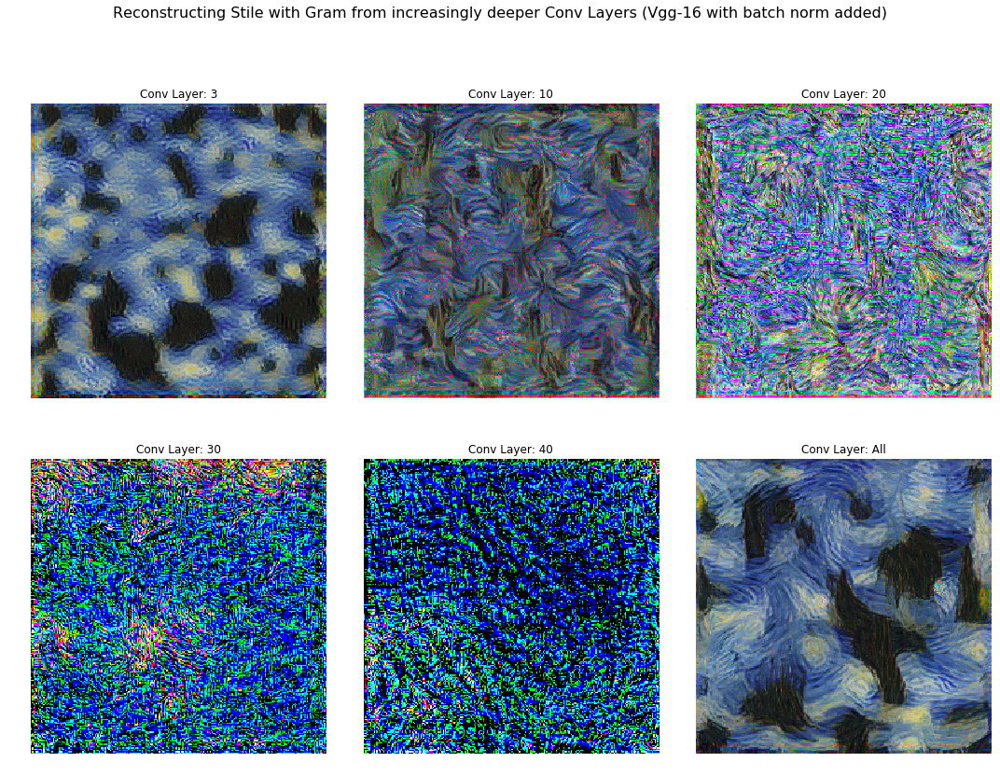

In [17]:
plot_reconstruct(reconstructs, layers, 'Conv Layer', 
                 f"Reconstructing Stile with Gram from increasingly deeper Conv Layers ({name})")

### Adding Style to Content

In [42]:
model(VV(original_t[None]))
target_cont = [V(o.features.clone()) for o in activations]

model(VV(style_t[None]))
target_style = [V(o.features.clone()) for o in activations]

In [45]:
opt_t, optimizer, coeff = get_opt(original, transform)

n_iter=0
while n_iter <= max_iter: 
    optimizer.step(partial(step, combined_loss, 0.5))

Iteration: 200, loss: 8390.349609375
Iteration: 400, loss: 6944.353515625
Iteration: 600, loss: 6675.8046875
Iteration: 800, loss: 6558.95068359375
Iteration: 1000, loss: 6491.29833984375


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


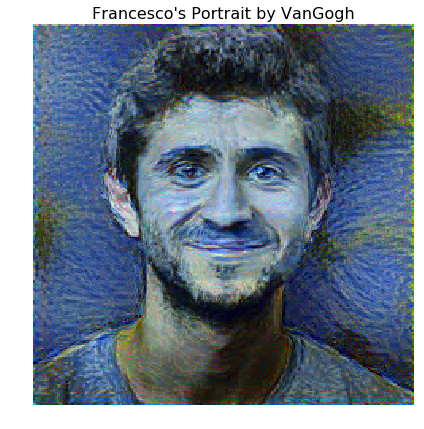

In [20]:
vangogh = untrasform(opt_t, transform)
plt.figure(figsize=(7,7))
plt.imshow(vangogh)
plt.axis('off');
plt.title(f"Francesco's Portrait by {style_name}", fontsize=16);
#for sf in sfs: sf.close()

## Picasso

### Style Loss

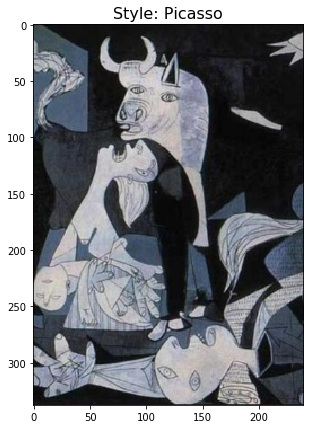

In [21]:
style_name = 'Picasso'
style_img = images[[i for i,l in enumerate(names) if l == style_name][0]]

plt.figure(figsize=(10,7));
plt.imshow(style_img);
plt.title(f'Style: {style_name}', fontsize=16);

In [22]:
style_t = transform(style_img)

model(VV(style_t[None]))
target_act = [V(o.features.clone()) for o in activations]

opt_t, optimizer, coeff = get_opt(style_img, transform)

reconstructs = []

for i, layer in enumerate(layers):
    n_iter=0
    opt_t, optimizer, coeff = get_opt(style_img, transform)
    if layer is None: 
        i = None
        layer = 'All'    
    
    print(f'Reconstructing Content using Conv Layer :{layer}')

    while n_iter <= max_iter:
        optimizer.step(partial(step, style_loss, i))
        
    reconstructs.append(untrasform(opt_t, transform))
    print('')

Reconstructing Content using Conv Layer :3
Iteration: 200, loss: 803.28564453125
Iteration: 400, loss: 19.52411651611328
Iteration: 600, loss: 3.542792320251465
Iteration: 800, loss: 1.2807940244674683
Iteration: 1000, loss: 0.5854424834251404

Reconstructing Content using Conv Layer :10
Iteration: 200, loss: 1131.607177734375
Iteration: 400, loss: 336.28350830078125
Iteration: 600, loss: 152.59829711914062
Iteration: 800, loss: 76.35537719726562
Iteration: 1000, loss: 39.35926055908203

Reconstructing Content using Conv Layer :20
Iteration: 200, loss: 244.6742401123047
Iteration: 400, loss: 64.54164123535156
Iteration: 600, loss: 31.455156326293945
Iteration: 800, loss: 19.585474014282227
Iteration: 1000, loss: 14.046008110046387

Reconstructing Content using Conv Layer :30
Iteration: 200, loss: 573.505615234375
Iteration: 400, loss: 100.95298767089844
Iteration: 600, loss: 47.92018127441406
Iteration: 800, loss: 30.844877243041992
Iteration: 1000, loss: 23.480892181396484

Reconstruc

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


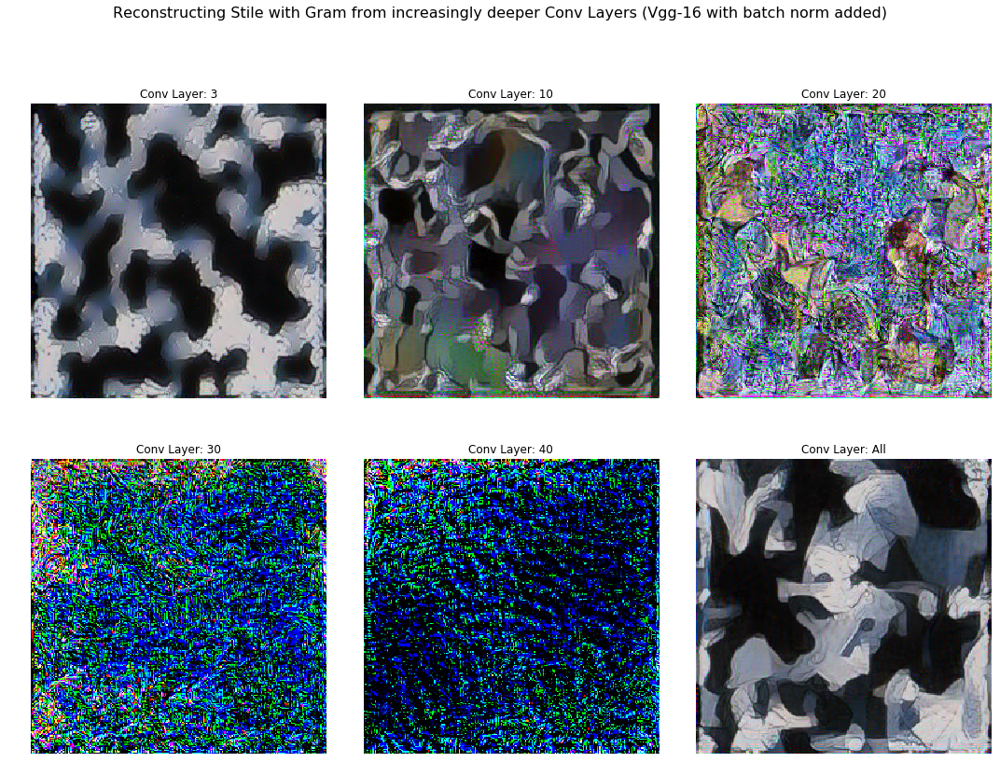

In [23]:
plot_reconstruct(reconstructs, layers, 'Conv Layer', 
                 f"Reconstructing Stile with Gram from increasingly deeper Conv Layers ({name})")

### Adding Style to Content

In [24]:
style_name = 'Picasso'
style_img = images[[i for i,l in enumerate(names) if l == style_name][0]]
style_t = transform(style_img)

In [25]:
model(VV(original_t[None]))
target_cont = [V(o.features.clone()) for o in activations]

model(VV(style_t[None]))
target_style = [V(o.features.clone()) for o in activations]

opt_t, optimizer, coeff = get_opt(original, transform)

n_iter=0
while n_iter <= max_iter: 
    optimizer.step(partial(step, combined_loss, 0.5))

Iteration: 200, loss: 22403.26953125
Iteration: 400, loss: 12999.98828125
Iteration: 600, loss: 10836.912109375
Iteration: 800, loss: 9991.5380859375
Iteration: 1000, loss: 9443.2373046875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


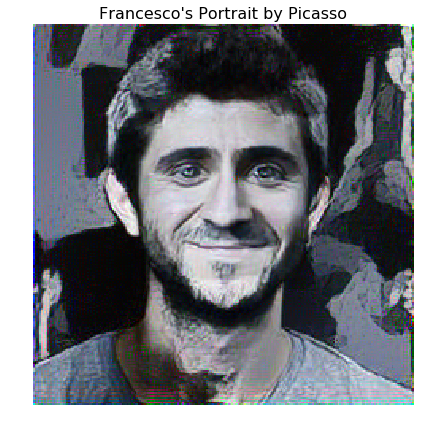

In [26]:
picasso = untrasform(opt_t, transform)
plt.figure(figsize=(7,7))
plt.imshow(picasso)
plt.axis('off');
plt.title(f"Francesco's Portrait by {style_name}", fontsize=16);
#for sf in sfs: sf.close()

## Kandinsky

### Testing Different Style2Content Ratios

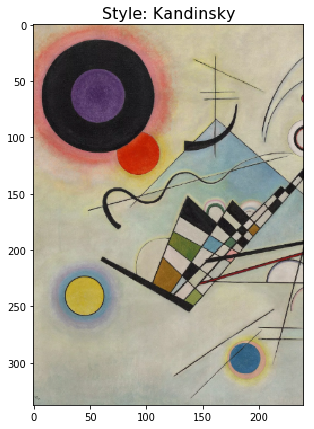

In [27]:
style_name = 'Kandinsky'
style_img = images[[i for i,l in enumerate(names) if l == style_name][0]]

plt.figure(figsize=(10,7));
plt.imshow(style_img);
plt.title(f'Style: {style_name}', fontsize=16);

In [28]:
style_t = transform(style_img)

model(VV(original_t[None]))
target_cont = [V(o.features.clone()) for o in activations]

model(VV(style_t[None]))
target_style = [V(o.features.clone()) for o in activations]

In [29]:
style_t = transform(style_img)

model(VV(original_t[None]))
target_cont = [V(o.features.clone()) for o in activations]

model(VV(style_t[None]))
target_style = [V(o.features.clone()) for o in activations]

opt_t, optimizer, coeff = get_opt(original, transform)

n_iter=0
while n_iter <= max_iter: 
    optimizer.step(partial(step, combined_loss, 0.5))

Iteration: 200, loss: 21604.515625
Iteration: 400, loss: 15672.82421875
Iteration: 600, loss: 13646.8125
Iteration: 800, loss: 12720.5791015625
Iteration: 1000, loss: 12279.5078125


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


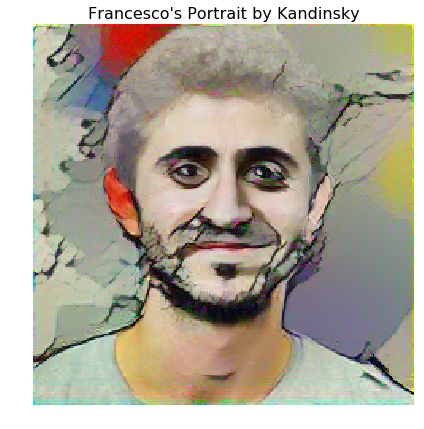

In [30]:
kand = untrasform(opt_t, transform)
plt.figure(figsize=(7,7))
plt.imshow(kand)
plt.axis('off');
plt.title(f"Francesco's Portrait by {style_name}", fontsize=16);

In [31]:
ratios_im = []
style2content_ratios = np.round(np.linspace(0, 1, 6), 2)

for ratio in style2content_ratios:
    n_iter=0
    opt_t, optimizer, coeff = get_opt(original, transform)
    
    print(f'Painting with a Style2Content Ratio of :{round(ratio, 2)}')

    while n_iter <= max_iter: 
        optimizer.step(partial(step, combined_loss, float(ratio)))
        
    ratios_im.append(untrasform(opt_t, transform))
    print('')

Painting with a Style2Content Ratio of :0.0
Iteration: 200, loss: 9908.8828125
Iteration: 400, loss: 6863.0634765625
Iteration: 600, loss: 5870.337890625
Iteration: 800, loss: 5300.99462890625
Iteration: 1000, loss: 4920.27734375

Painting with a Style2Content Ratio of :0.2
Iteration: 200, loss: 17489.337890625
Iteration: 400, loss: 13851.189453125
Iteration: 600, loss: 12519.314453125
Iteration: 800, loss: 11853.671875
Iteration: 1000, loss: 11444.767578125

Painting with a Style2Content Ratio of :0.4
Iteration: 200, loss: 21934.48046875
Iteration: 400, loss: 16209.1796875
Iteration: 600, loss: 14517.10546875
Iteration: 800, loss: 13637.4140625
Iteration: 1000, loss: 13109.9091796875

Painting with a Style2Content Ratio of :0.6
Iteration: 200, loss: 19518.515625
Iteration: 400, loss: 14195.0908203125
Iteration: 600, loss: 12486.931640625
Iteration: 800, loss: 11725.865234375
Iteration: 1000, loss: 11329.341796875

Painting with a Style2Content Ratio of :0.8
Iteration: 200, loss: 15538

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


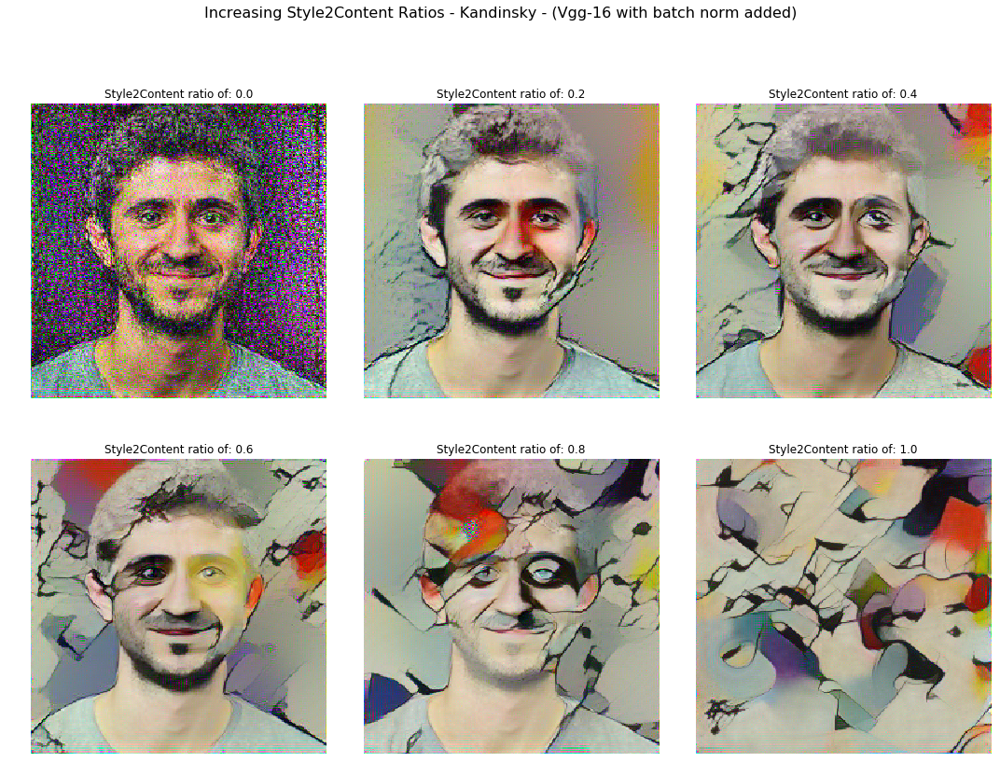

In [32]:
plot_reconstruct(ratios_im, style2content_ratios, 'Style2Content ratio of',
                 f"Increasing Style2Content Ratios - {style_name} - ({name})")

## Monet

### Testing Different Style2Content Ratios (Continued)

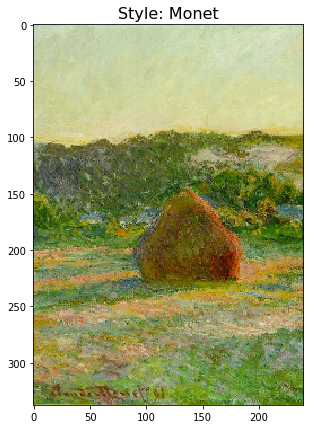

In [33]:
style_name = 'Monet'
style_img = images[[i for i,l in enumerate(names) if l == style_name][0]]

plt.figure(figsize=(10,7));
plt.imshow(style_img);
plt.title(f'Style: {style_name}', fontsize=16);

In [34]:
style_t = transform(style_img)

model(VV(original_t[None]))
target_cont = [V(o.features.clone()) for o in activations]

model(VV(style_t[None]))
target_style = [V(o.features.clone()) for o in activations]

In [35]:
style_t = transform(style_img)

model(VV(original_t[None]))
target_cont = [V(o.features.clone()) for o in activations]

model(VV(style_t[None]))
target_style = [V(o.features.clone()) for o in activations]

opt_t, optimizer, coeff = get_opt(original, transform)

n_iter=0
while n_iter <= max_iter: 
    optimizer.step(partial(step, combined_loss, 0.5))

Iteration: 200, loss: 8152.7607421875
Iteration: 400, loss: 6513.05126953125
Iteration: 600, loss: 6205.5615234375
Iteration: 800, loss: 6090.7431640625
Iteration: 1000, loss: 6029.92822265625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


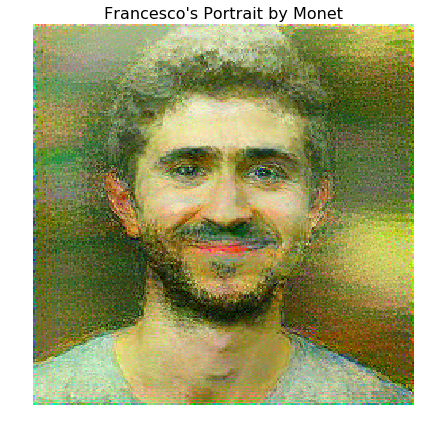

In [36]:
monet = untrasform(opt_t, transform)
plt.figure(figsize=(7,7))
plt.imshow(monet)
plt.axis('off');
plt.title(f"Francesco's Portrait by {style_name}", fontsize=16);

In [37]:
ratios_im = []
style2content_ratios = np.round(np.linspace(0, 1, 6), 2)

for ratio in style2content_ratios:
    n_iter=0
    opt_t, optimizer, coeff = get_opt(original, transform)
    
    print(f'Painting with a Style2Content Ratio of :{round(ratio, 2)}')

    while n_iter <= max_iter: 
        optimizer.step(partial(step, combined_loss, float(ratio)))
        
    ratios_im.append(untrasform(opt_t, transform))
    print('')

Painting with a Style2Content Ratio of :0.0
Iteration: 200, loss: 9532.3486328125
Iteration: 400, loss: 6679.90673828125
Iteration: 600, loss: 5681.359375
Iteration: 800, loss: 5117.24755859375
Iteration: 1000, loss: 4767.53662109375

Painting with a Style2Content Ratio of :0.2
Iteration: 200, loss: 8682.615234375
Iteration: 400, loss: 7268.9892578125
Iteration: 600, loss: 6976.8173828125
Iteration: 800, loss: 6853.9365234375
Iteration: 1000, loss: 6787.3046875

Painting with a Style2Content Ratio of :0.4
Iteration: 200, loss: 8409.244140625
Iteration: 400, loss: 7158.640625
Iteration: 600, loss: 6867.76953125
Iteration: 800, loss: 6730.669921875
Iteration: 1000, loss: 6654.091796875

Painting with a Style2Content Ratio of :0.6
Iteration: 200, loss: 6805.345703125
Iteration: 400, loss: 5661.2138671875
Iteration: 600, loss: 5444.1474609375
Iteration: 800, loss: 5357.90478515625
Iteration: 1000, loss: 5310.23291015625

Painting with a Style2Content Ratio of :0.8
Iteration: 200, loss: 504

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


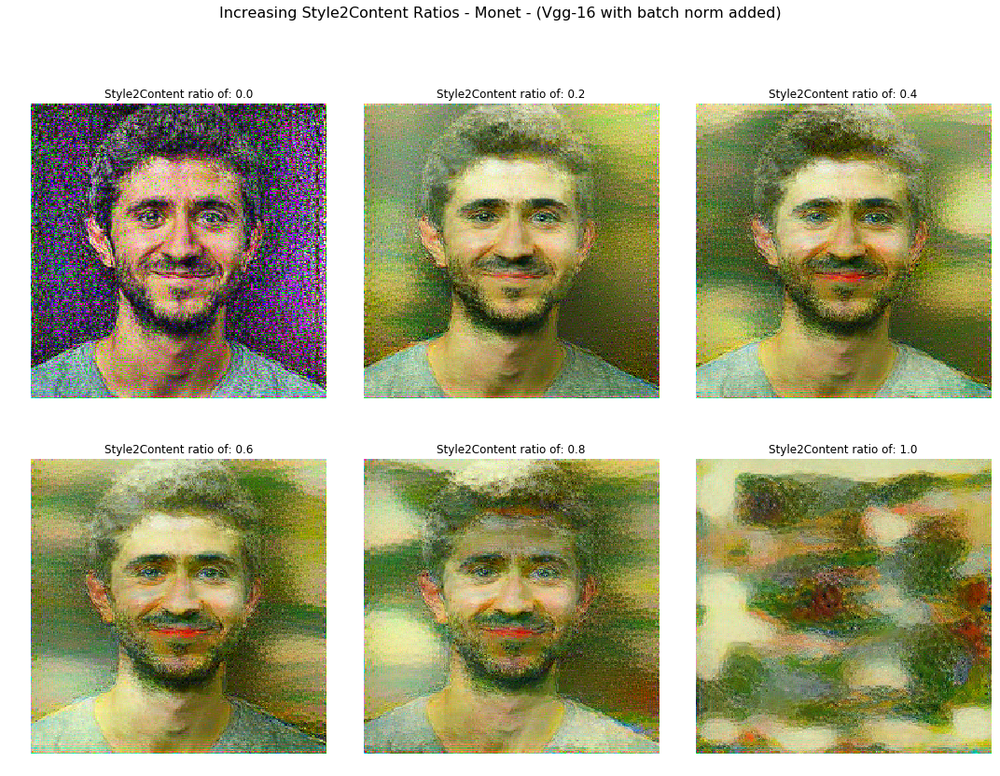

In [38]:
plot_reconstruct(ratios_im, style2content_ratios, 'Style2Content ratio of',
                 f"Increasing Style2Content Ratios - {style_name} - ({name})")